# Converting words to numbers
Machine learning or Deep learning models cannot understand words and hence those are to be converted into numbers.

Basically there are three ways of converting words into numbers :   
1. Assinging unique number to each word
2. One Hot Encoding
3. Word Embeddings

**Assinging unique number to each word**    
1. Here the numbers are random they don't capture the relationship between the words.   
For example, consider Dhoni and Kohli. They are players but it does not capture the relationship between them as players.

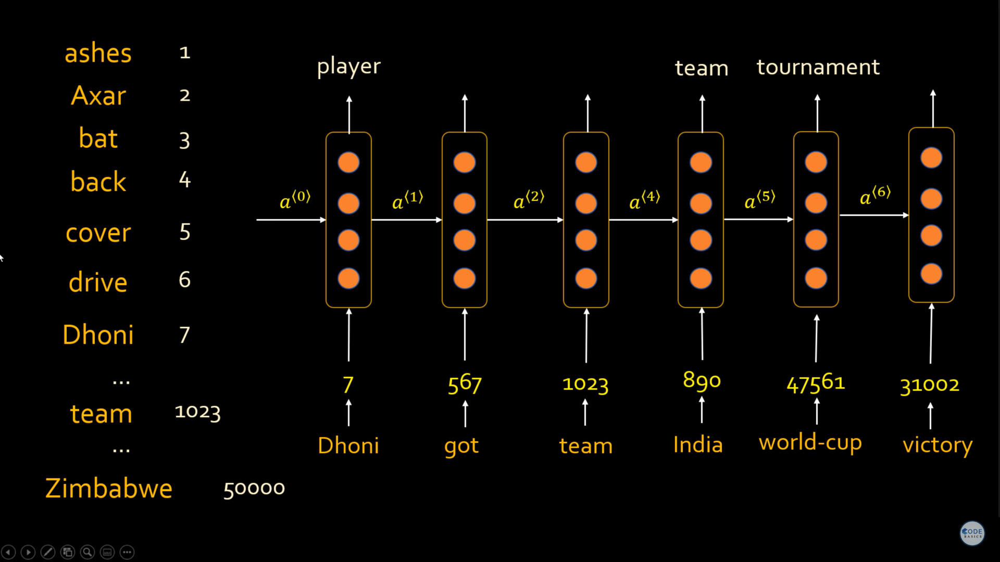

**One Hot Encoding**
1. It doesn't capture relationship between the words.
2. It is computationally in-efficient.
For example, if there are 50000 words, then One Hot Encoding should be done for 5000 words. i.e size of each word is the vector of size 50000.

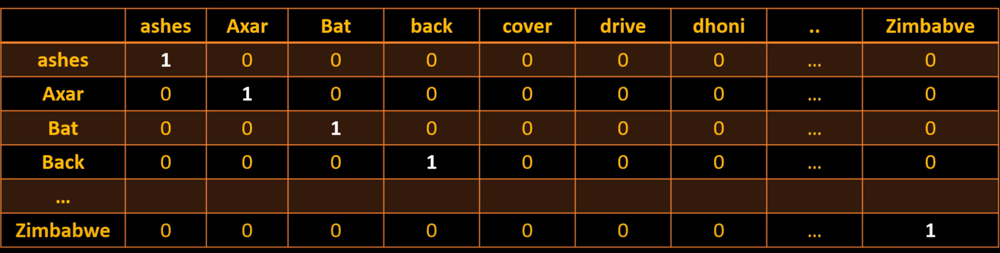

**Word Embeddings**    
Mainly two techniques:
1. TF-IDF
2. Word2Vec 

Advantages:
1. It can capture the relationship between words by considering various parameters.

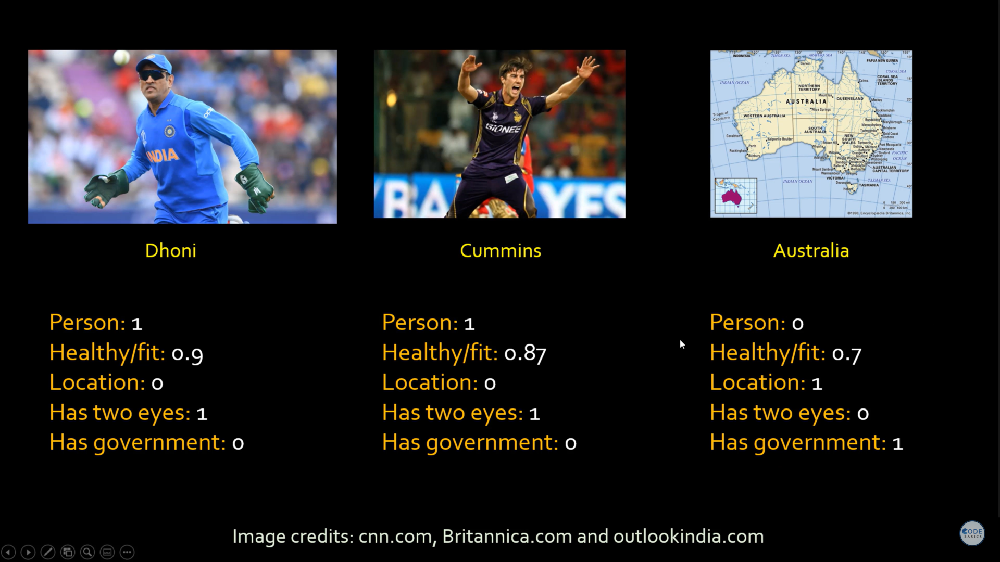

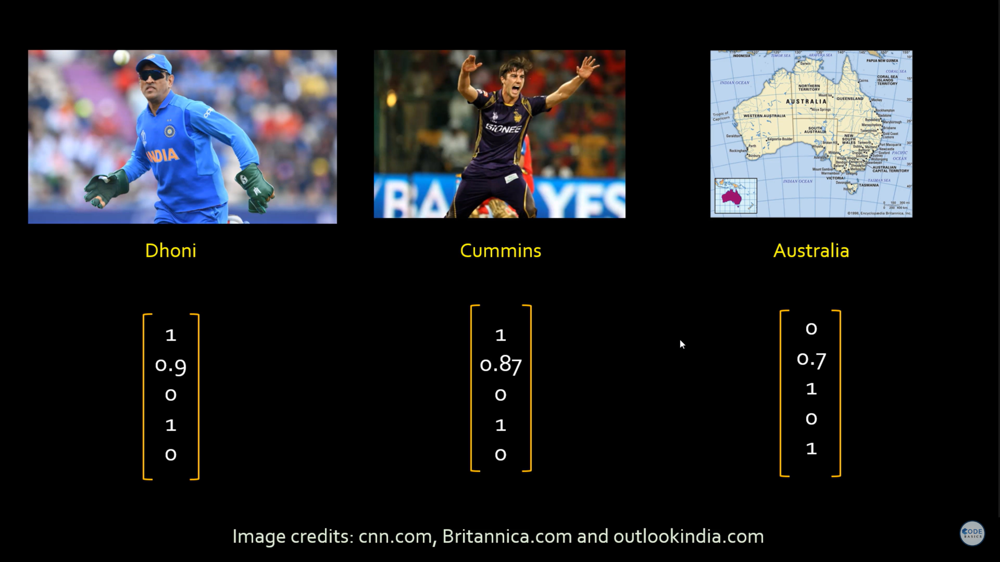

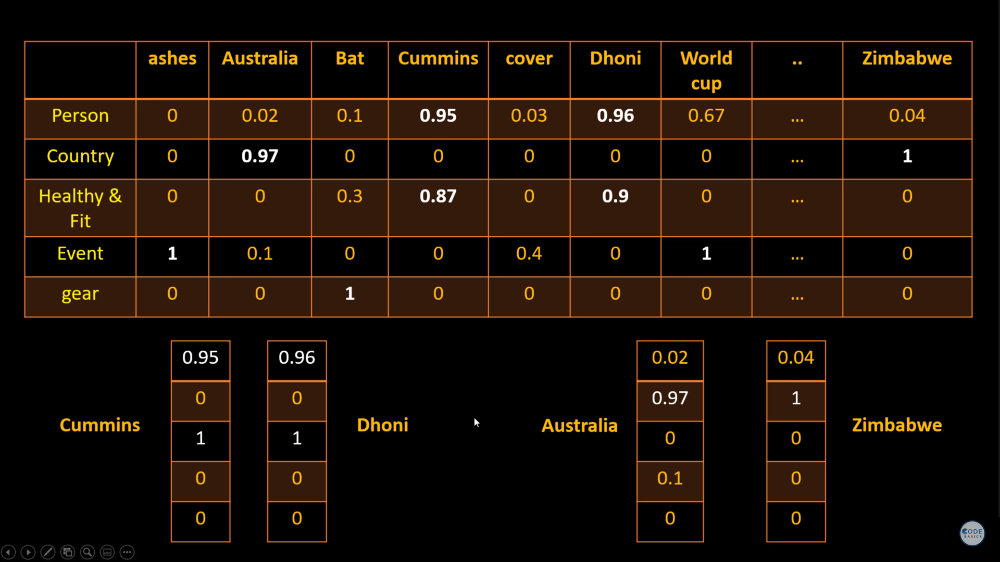
Here, it can capture the relationship between Dhoni and Cummins as players, and between Australia and Zimbabwe as countries.

**Techniques to compute word embeddings :**     
1. Supervised Learning
2. Unsupervised Learning        
    i.Word2Vec       
    ii.GloVe       

**Supervised Learning Word Embedding**  

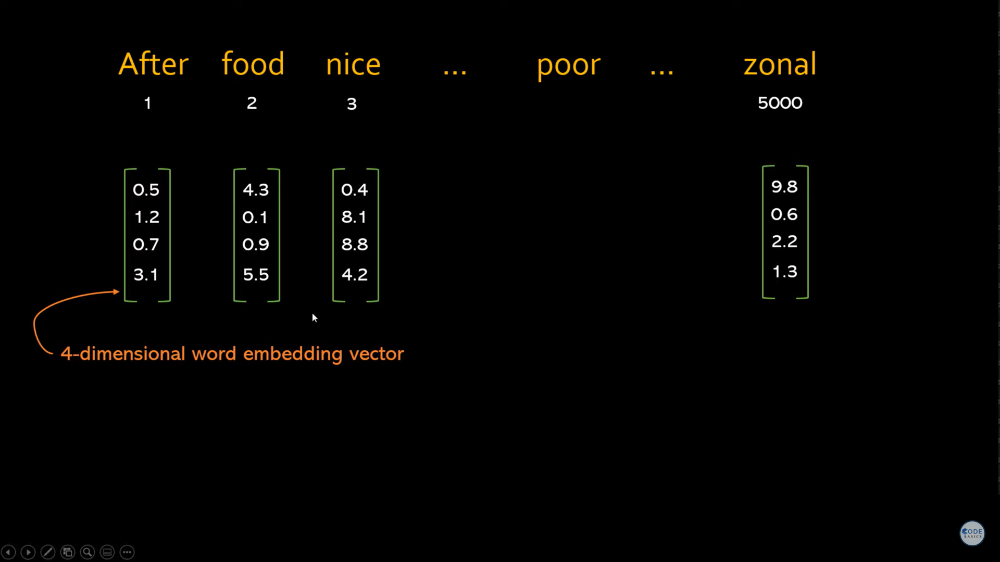

Embedded matrix is created with random values and those are corrected later by calculating loss and backpropogating the error.
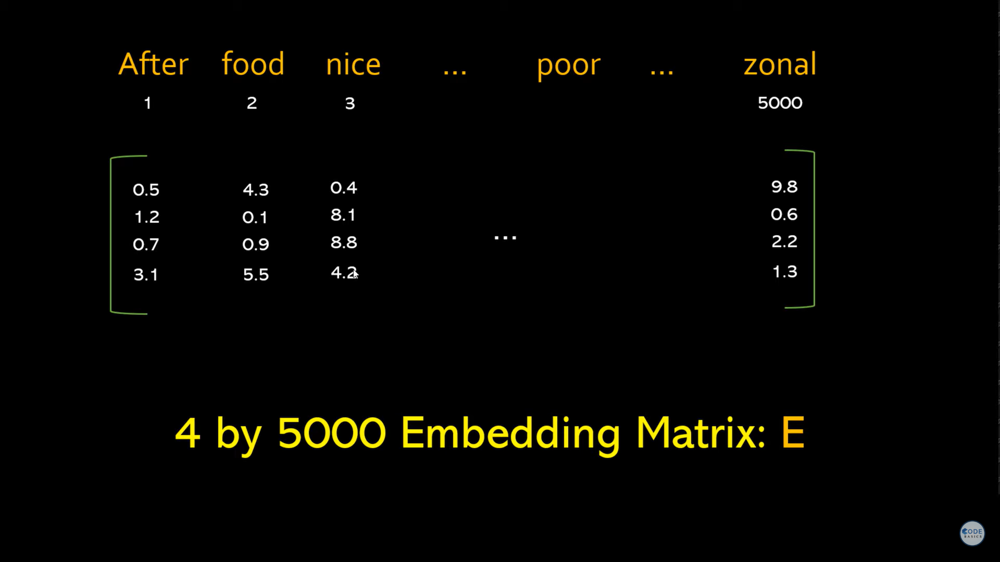

One Hot Encoding
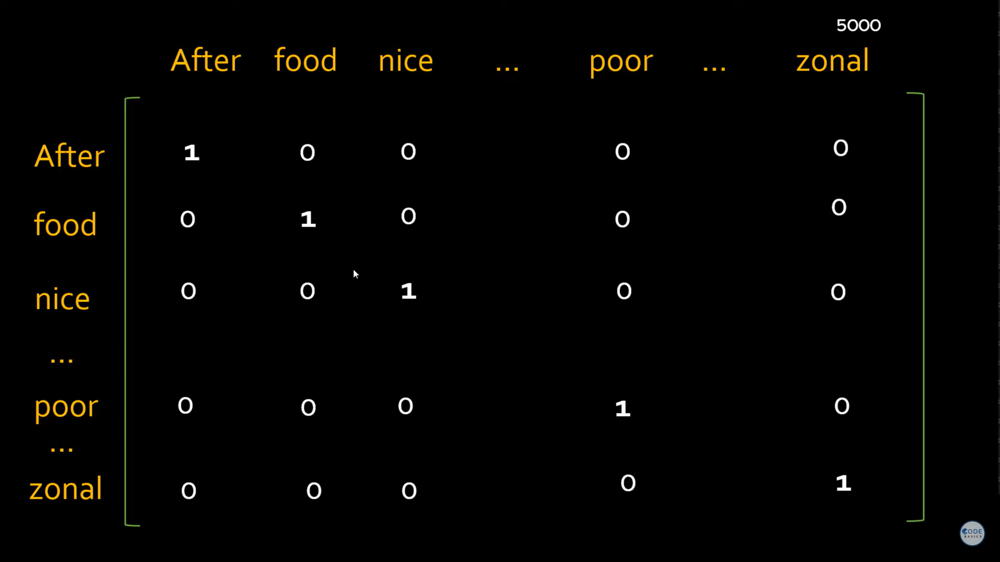

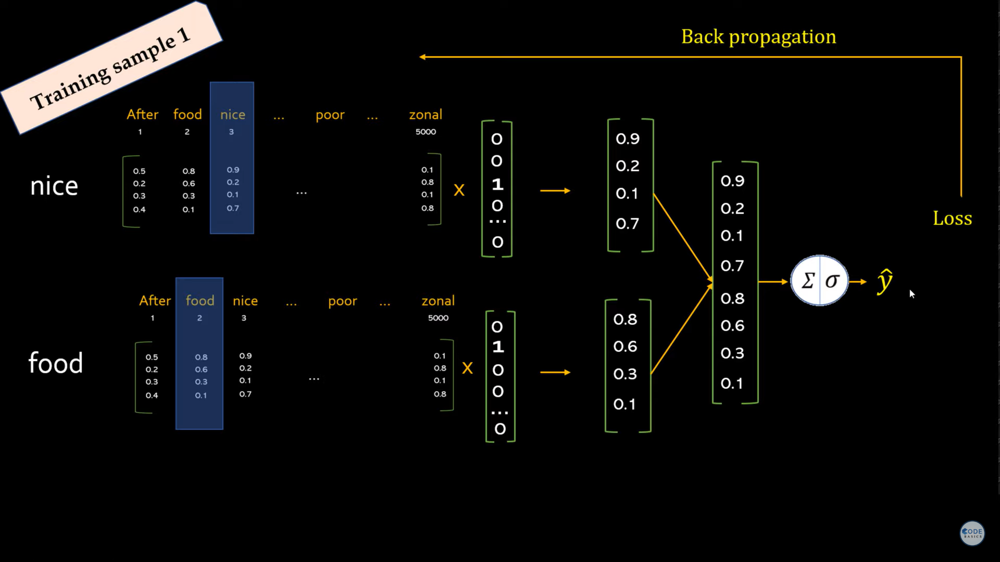
Suppose we want to extract the vector for "nice", then the Embedded matrix should be multiplied with One Hot Encoded vector of "nice".   
similarly, the process is continued for every word and vectors of every word are combined and flattened as a single vector and is sent to the model as an input that undergoes activation and pre-activation functions and provides the output.   
The obtained output is compared with original output and loss is calculated.    
The Error is backpropogated and the weights are adjusted until the ideal weights are obtained and error is less.

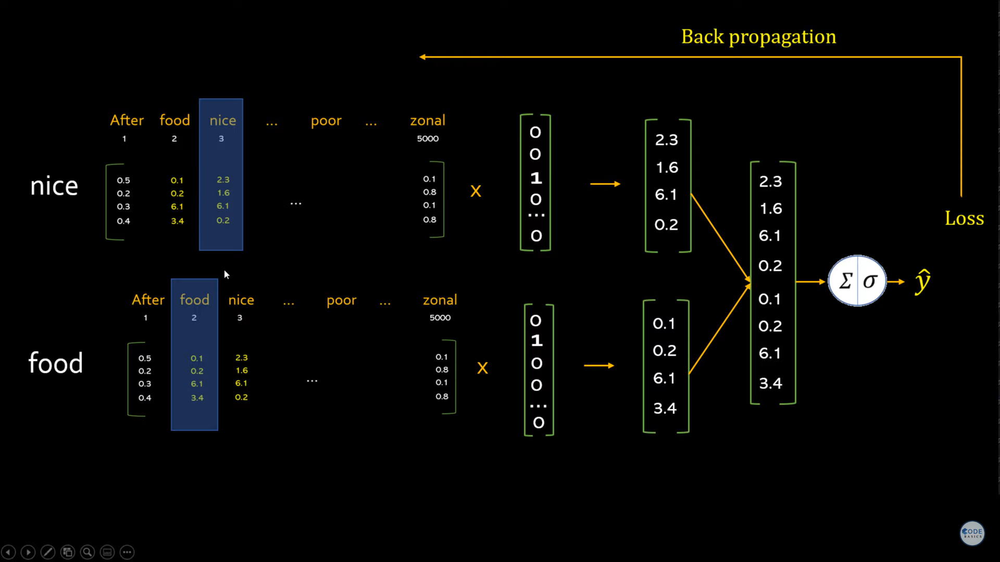
Here, the weights are updated.

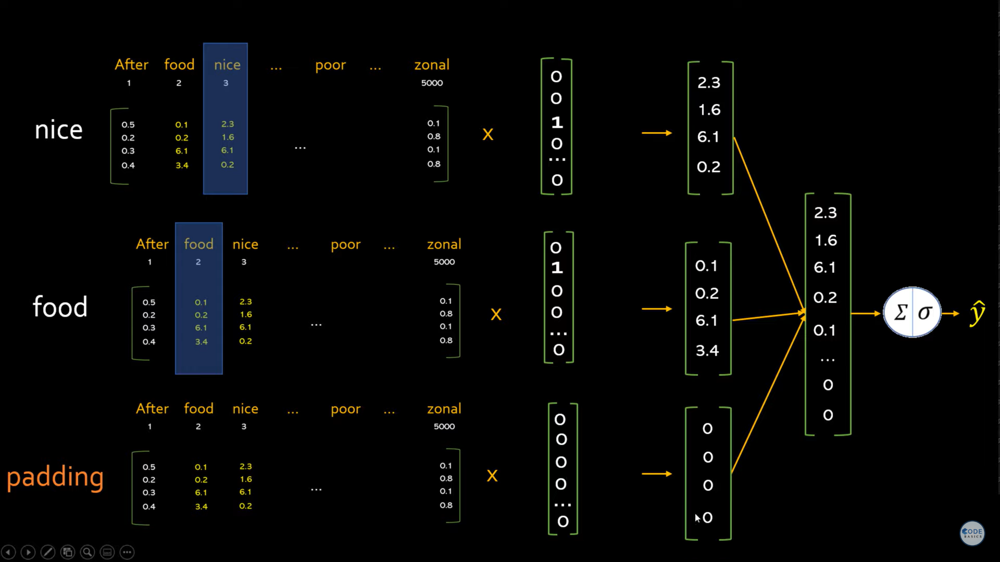
Suppose the maximum sentence size is set as 3 but our sentence size is 2, then the remaing one word is padded with zeros vector.

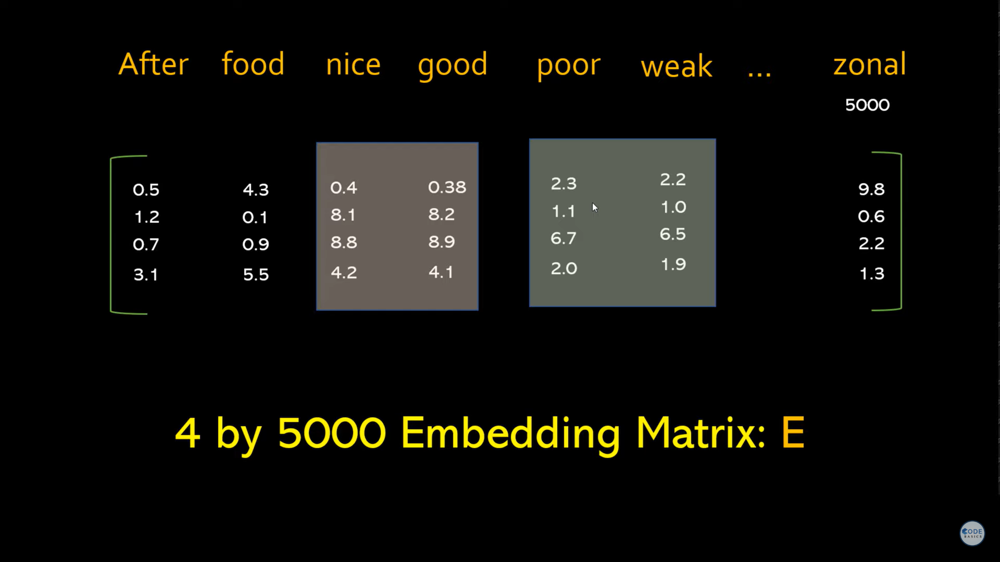
Here, "nice" and "good" are similar words similarly "weak" and "poor" are also similar words and hence vector values for similar words are similar.

Reference article - https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/

**Word Embedding using Keras embedding layer**

In [3]:
import numpy as np
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Embedding

In [4]:
reviews = ['nice food',
        'amazing restaurant',
        'too good',
        'just loved it!',
        'will go again',
        'horrible food',
        'never go there',
        'poor service',
        'poor quality',
        'needs improvement']

sentiment = np.array([1,1,1,1,1,0,0,0,0,0])

In [35]:
vocab_size=30 #it is just as we considered 5000 in above example
#checking how one_hot method works
one_hot(input_text='nice food',n=vocab_size) #here unique numbers are randomly allocated to each word from 1 to 30

[14, 18]

In [36]:
one_hot_encoded_reviews=[one_hot(text,vocab_size) for text in reviews]
one_hot_encoded_reviews

[[14, 18],
 [2, 24],
 [6, 19],
 [17, 1, 9],
 [12, 15, 17],
 [13, 18],
 [19, 15, 24],
 [17, 6],
 [17, 16],
 [7, 22]]

In [37]:
#here some sentences are of size 2 and some other of size 3 and hence padding will be done.
max_sent_len=4 #maximum length of sentence is 4
padded_reviews=pad_sequences(sequences=one_hot_encoded_reviews,maxlen=max_sent_len,padding='post')
#since padding='post' padding is done at end, by default padding='pre'

In [38]:
padded_reviews

array([[14, 18,  0,  0],
       [ 2, 24,  0,  0],
       [ 6, 19,  0,  0],
       [17,  1,  9,  0],
       [12, 15, 17,  0],
       [13, 18,  0,  0],
       [19, 15, 24,  0],
       [17,  6,  0,  0],
       [17, 16,  0,  0],
       [ 7, 22,  0,  0]])

In [39]:
embedded_vector_size=5 #no. of rows in embedded matrix
model=Sequential()
model.add(Embedding(input_dim=vocab_size,output_dim=embedded_vector_size,input_length=max_sent_len,name="embedding"))
model.add(Flatten())
model.add(Dense(1,activation='sigmoid'))

In [40]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 4, 5)              150       
                                                                 
 flatten_1 (Flatten)         (None, 20)                0         
                                                                 
 dense_1 (Dense)             (None, 1)                 21        
                                                                 
Total params: 171
Trainable params: 171
Non-trainable params: 0
_________________________________________________________________


In [41]:
x=padded_reviews
y=sentiment

In [42]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [43]:
#training the model
model.fit(x,y,epochs=50,verbose=0) 
# verbose = 1 will display epochs status , verbose = 0 will display as below, verbose = 2 will display similar to 1 but not same

In [44]:
#evaluating the model
loss,accuracy=model.evaluate(x,y)

1/1 [==============================] - 0s 295ms/step - loss: 0.6298 - accuracy: 1.0000


In [45]:
loss,accuracy

(0.6297937631607056, 1.0)

In [48]:
weights=model.get_layer("embedding").get_weights()[0]
len(weights)

30

In [49]:
#checking the weights for "nice" word
weights[14] # 14 is the one_hot_encoded number

array([ 0.04366346,  0.08759189,  0.05986383, -0.05006896,  0.07535194],
      dtype=float32)

In [50]:
#checking the weights for "amazing" word
weights[2]

array([ 0.08166654,  0.01416467,  0.06266033, -0.08584082,  0.07362106],
      dtype=float32)

Here, we can observe that "nice" and "amazing" are similar words but their vectors are not similar due to small dataset.   
If the dataset is large we can observe similar vector values for these two words

# Word2Vec
Word2vec is one of the most popular implementations of word embedding. It is used to create a distributed representation of words into numerical vectors. Word2vec converts text into vectors that capture semantics and relationships among words.    
Word2Vec is a technique in computer science that allows you to perform mathematics with words.  
Example : **King - Man + Woman = Queen**

Two types : 
1. continuous bag of words (CBOW)
2. Skip-gram

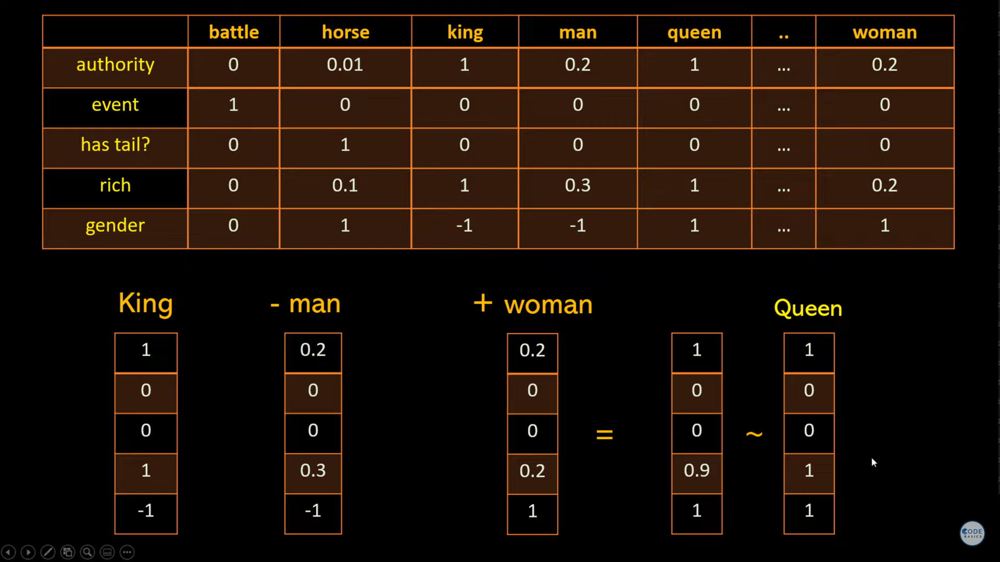

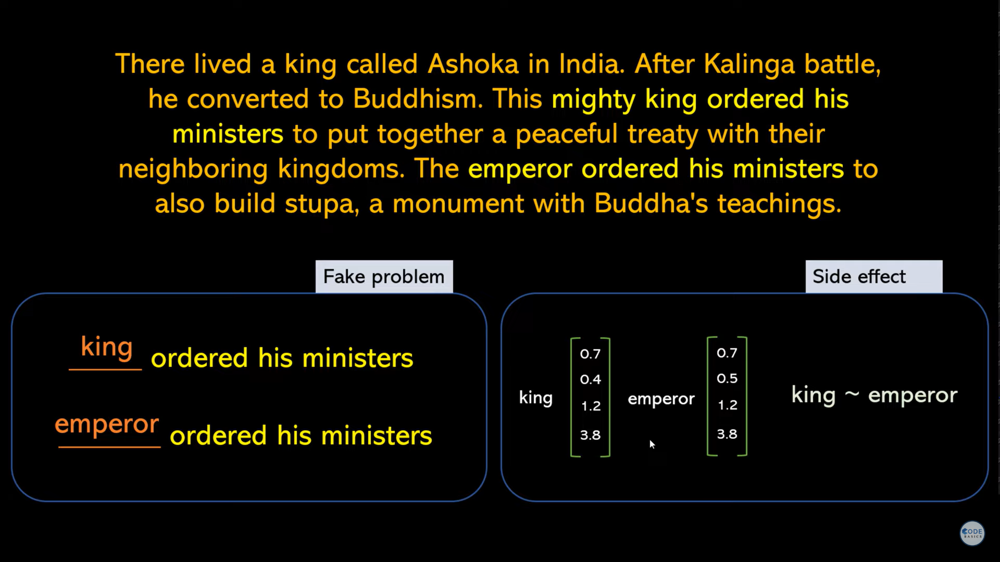
Fake problem - our main focus is not on filling the missing word   
Side effect - our main focus in on finding the vector for missing word(target) based on remaining words(context).

**Continuous bag of words (CBOW)** -> context to target   
Here, the word embedding(weights) is a layer between hidden layer and output layer.

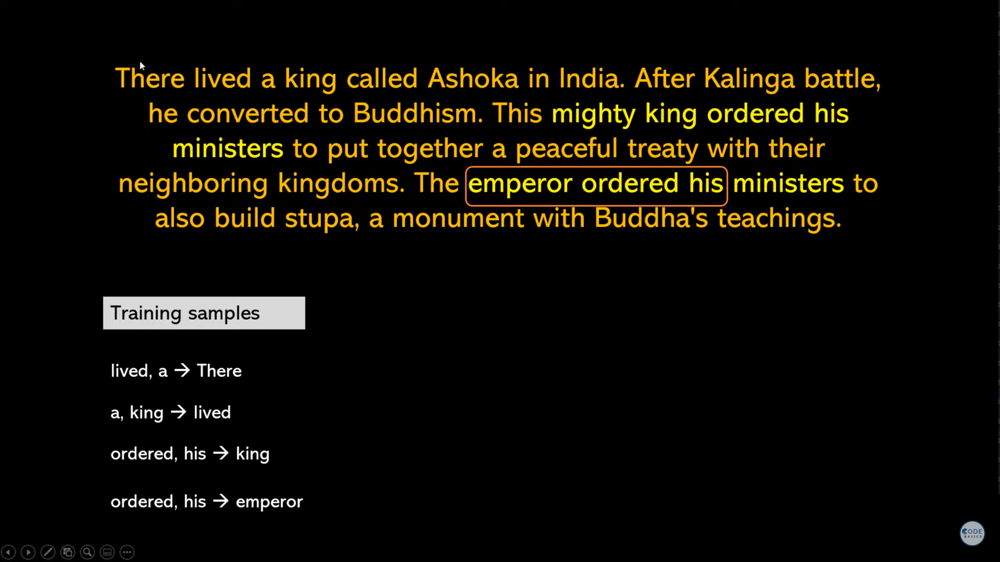

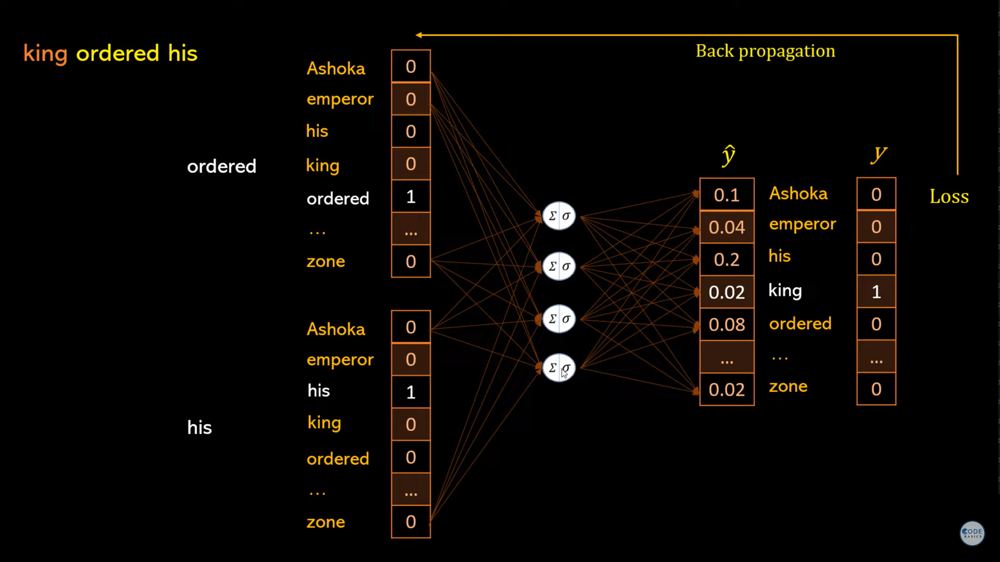
Intially the predicted vector is wrong and after backpropogation the weights will be adjusted.

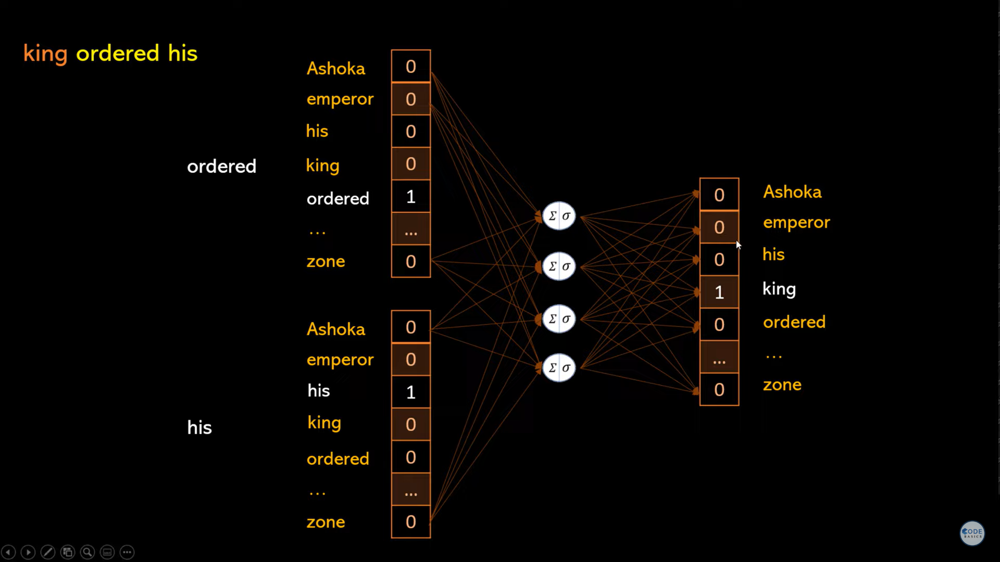

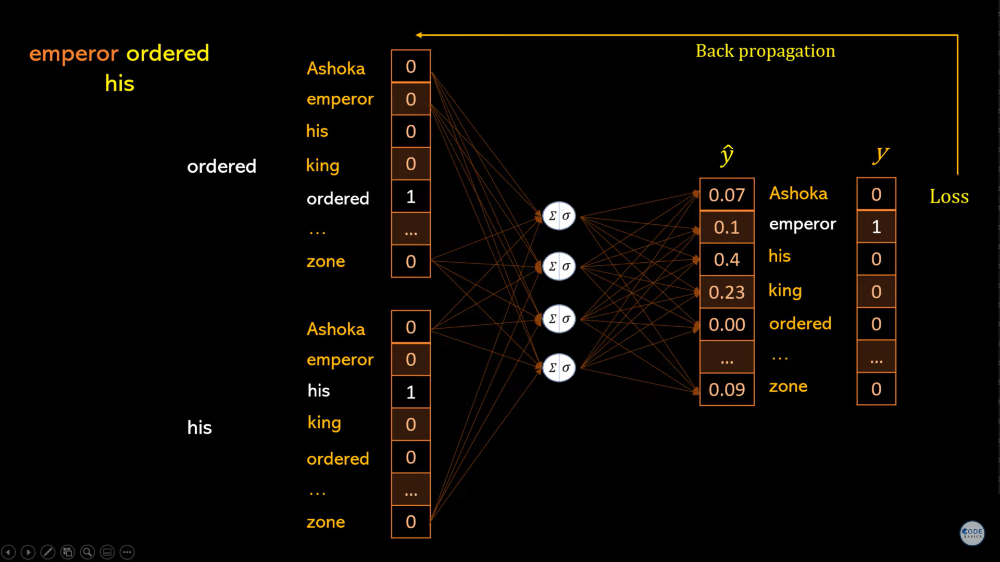

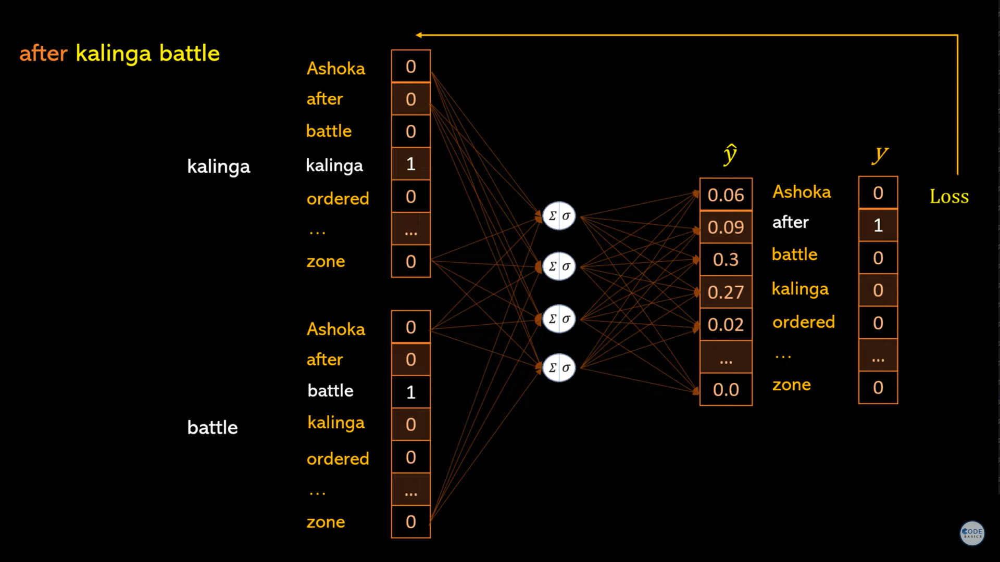

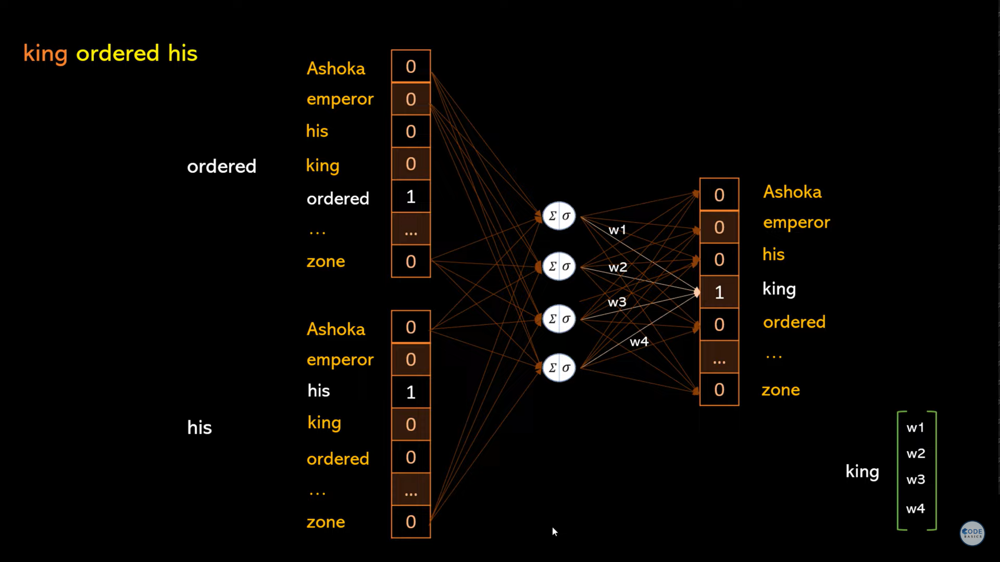

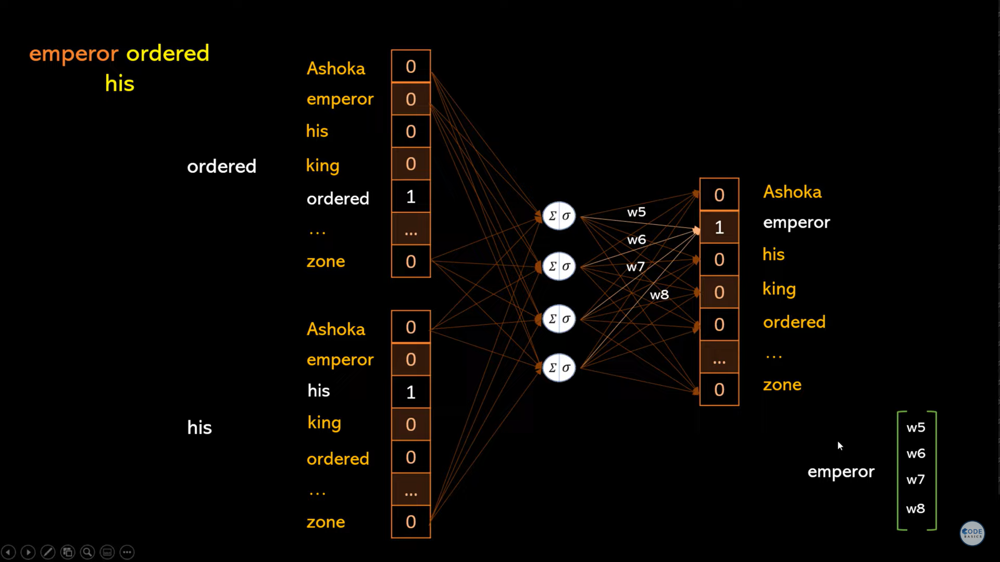

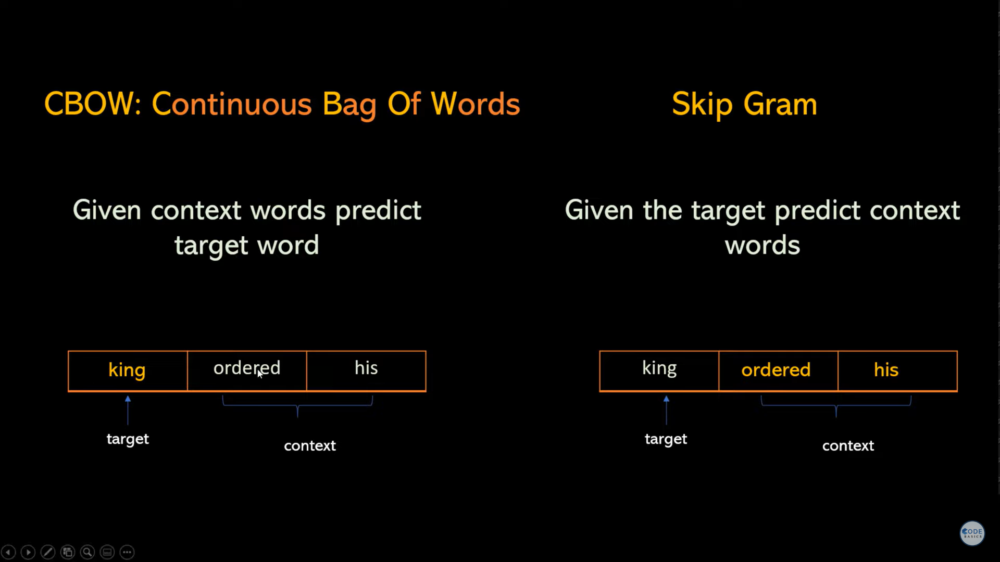

**Skip Gram** -> target word to context   
Here, the word embedding(weights) is a layer between input layer and hidden layer.

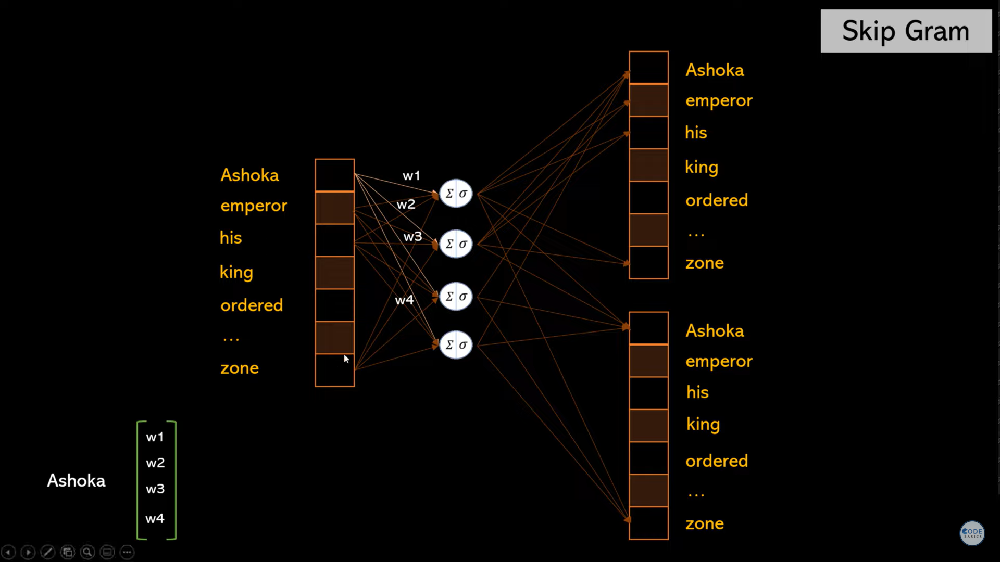

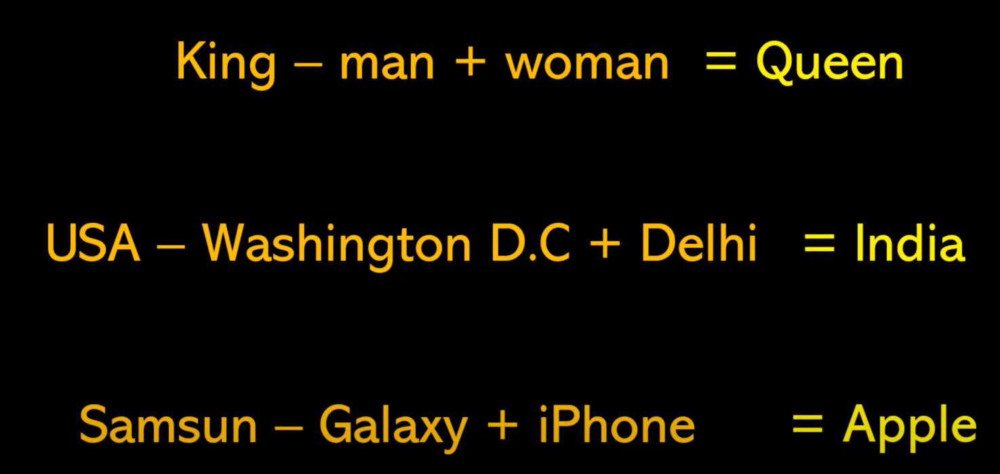

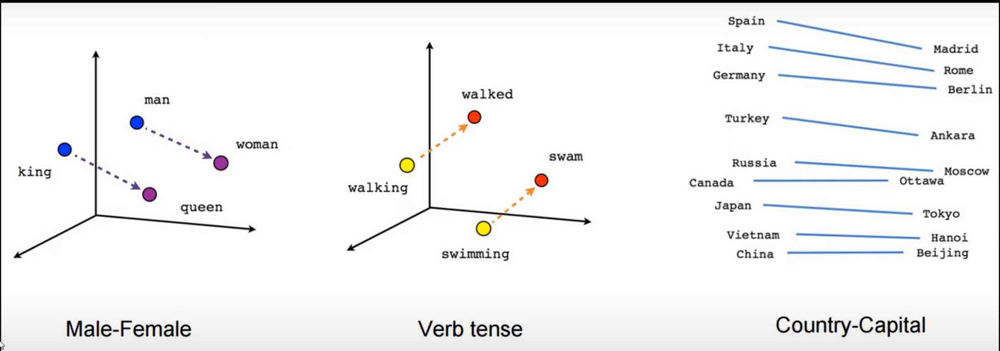

# Implementation of Word2Vec in gensim

In [1]:
#!pip install gensim   # It is a popular NLP library

ERROR: Invalid requirement: '#'


In [2]:
#!pip install python-Levenshtein

Levenshtein distance is a lexical similarity measure which identifies the distance between one pair of strings. It does so by counting the number of times you would have to insert, delete or substitute a character from string 1 to make it like string 2

In [3]:
import gensim
import pandas as pd

In [6]:
data=pd.read_json("D:\programming languages\datasets\Cell_Phones_and_Accessories_5.json",lines=True)
#lines=True -> read every line of a file as a json object

In [7]:
data

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A30TL5EWN6DFXT,120401325X,christina,"[0, 0]",They look good and stick good! I just don't li...,4,Looks Good,1400630400,"05 21, 2014"
1,ASY55RVNIL0UD,120401325X,emily l.,"[0, 0]",These stickers work like the review says they ...,5,Really great product.,1389657600,"01 14, 2014"
2,A2TMXE2AFO7ONB,120401325X,Erica,"[0, 0]",These are awesome and make my phone look so st...,5,LOVE LOVE LOVE,1403740800,"06 26, 2014"
3,AWJ0WZQYMYFQ4,120401325X,JM,"[4, 4]",Item arrived in great time and was in perfect ...,4,Cute!,1382313600,"10 21, 2013"
4,ATX7CZYFXI1KW,120401325X,patrice m rogoza,"[2, 3]","awesome! stays on, and looks great. can be use...",5,leopard home button sticker for iphone 4s,1359849600,"02 3, 2013"
...,...,...,...,...,...,...,...,...,...
194434,A1YMNTFLNDYQ1F,B00LORXVUE,eyeused2loveher,"[0, 0]",Works great just like my original one. I reall...,5,This works just perfect!,1405900800,"07 21, 2014"
194435,A15TX8B2L8B20S,B00LORXVUE,Jon Davidson,"[0, 0]",Great product. Great packaging. High quality a...,5,Great replacement cable. Apple certified,1405900800,"07 21, 2014"
194436,A3JI7QRZO1QG8X,B00LORXVUE,Joyce M. Davidson,"[0, 0]","This is a great cable, just as good as the mor...",5,Real quality,1405900800,"07 21, 2014"
194437,A1NHB2VC68YQNM,B00LORXVUE,Nurse Farrugia,"[0, 0]",I really like it becasue it works well with my...,5,I really like it becasue it works well with my...,1405814400,"07 20, 2014"


Here, only "reviewText" column is useful for our model training.

In [9]:
data.reviewText[0]

"They look good and stick good! I just don't like the rounded shape because I was always bumping it and Siri kept popping up and it was irritating. I just won't buy a product like this again"

In [10]:
#removing all the symbols, stop words and it will convert all the text into lowercase letters
gensim.utils.simple_preprocess(data.reviewText[0])

['they',
 'look',
 'good',
 'and',
 'stick',
 'good',
 'just',
 'don',
 'like',
 'the',
 'rounded',
 'shape',
 'because',
 'was',
 'always',
 'bumping',
 'it',
 'and',
 'siri',
 'kept',
 'popping',
 'up',
 'and',
 'it',
 'was',
 'irritating',
 'just',
 'won',
 'buy',
 'product',
 'like',
 'this',
 'again']

In [11]:
#applying simple preprocessing for entire "reviewText" column
reviews=data.reviewText.apply(gensim.utils.simple_preprocess)

In [12]:
reviews

0         [they, look, good, and, stick, good, just, don...
1         [these, stickers, work, like, the, review, say...
2         [these, are, awesome, and, make, my, phone, lo...
3         [item, arrived, in, great, time, and, was, in,...
4         [awesome, stays, on, and, looks, great, can, b...
                                ...                        
194434    [works, great, just, like, my, original, one, ...
194435    [great, product, great, packaging, high, quali...
194436    [this, is, great, cable, just, as, good, as, t...
194437    [really, like, it, becasue, it, works, well, w...
194438    [product, as, described, have, wasted, lot, of...
Name: reviewText, Length: 194439, dtype: object

In [13]:
#initializing gensim model
model=gensim.models.Word2Vec(
    window=10, # it indicates that considering 10 words before target word and 10 words after target word
    min_count=2, #it means that do not consider a sentene that has less than 2 words
    workers=4 #how many CPU threads (cores) we want to use 
)

In [14]:
model.build_vocab(
    corpus_iterable=reviews, 
    progress_per=1000 #after how many words we want to see a progress bar
)

Actually it should give progress bar after every 1000 words but it isn't due to some issues with jupyter notebook.

In [15]:
model.epochs #by default the epochs are set to 5

5

In [16]:
model.corpus_count #it gives the count of total number of samples

194439

In [17]:
model.train(reviews,total_examples=model.corpus_count,epochs=model.epochs)

(61505380, 83868975)

In [18]:
model.wv.most_similar("bad") # it gives all the words that are similar(not synonyms) to bad

[('terrible', 0.6772564053535461),
 ('shabby', 0.6427361965179443),
 ('horrible', 0.6044268012046814),
 ('good', 0.5841922163963318),
 ('crappy', 0.5376121997833252),
 ('legit', 0.5322872996330261),
 ('okay', 0.5304518938064575),
 ('funny', 0.5207275152206421),
 ('disappointing', 0.5174784660339355),
 ('ok', 0.5161736607551575)]

In [20]:
model.wv.most_similar("because")

[('since', 0.6981565356254578),
 ('bc', 0.5920987129211426),
 ('why', 0.5870192050933838),
 ('but', 0.5691695809364319),
 ('so', 0.5526853799819946),
 ('cuz', 0.5438127517700195),
 ('becasue', 0.524445652961731),
 ('becuase', 0.5210072994232178),
 ('unfortunately', 0.5059455633163452),
 ('however', 0.4611665606498718)]

In [21]:
model.wv.most_similar("product")

[('item', 0.8764402270317078),
 ('products', 0.5304863452911377),
 ('seller', 0.5011450052261353),
 ('company', 0.49780988693237305),
 ('merchandise', 0.4975515305995941),
 ('transaction', 0.4903416931629181),
 ('value', 0.48339104652404785),
 ('vendor', 0.4822525978088379),
 ('workmanship', 0.4723050594329834),
 ('unit', 0.4661054313182831)]

In [26]:
model.wv.similarity(w1="good",w2="great") #it gives the similarity between two words (cosine similarity)

0.7864173

In [28]:
model.wv.similarity(w1="item",w2="product")

0.87644017

In [33]:
model.wv.similarity("great","product") #here these two words are not at all similar hence it is giving -ve value

-0.030111466

# Excercise

In [1]:
import pandas as pd
import gensim

In [2]:
#reading json file
df=pd.read_json("D:\programming languages\datasets\Sports_and_Outdoors_5.json",lines=True)

In [3]:
df

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,AIXZKN4ACSKI,1881509818,David Briner,"[0, 0]",This came in on time and I am veru happy with ...,5,Woks very good,1390694400,"01 26, 2014"
1,A1L5P841VIO02V,1881509818,Jason A. Kramer,"[1, 1]",I had a factory Glock tool that I was using fo...,5,Works as well as the factory tool,1328140800,"02 2, 2012"
2,AB2W04NI4OEAD,1881509818,J. Fernald,"[2, 2]",If you don't have a 3/32 punch or would like t...,4,"It's a punch, that's all.",1330387200,"02 28, 2012"
3,A148SVSWKTJKU6,1881509818,"Jusitn A. Watts ""Maverick9614""","[0, 0]",This works no better than any 3/32 punch you w...,4,It's a punch with a Glock logo.,1328400000,"02 5, 2012"
4,AAAWJ6LW9WMOO,1881509818,Material Man,"[0, 0]",I purchased this thinking maybe I need a speci...,4,"Ok,tool does what a regular punch does.",1366675200,"04 23, 2013"
...,...,...,...,...,...,...,...,...,...
296332,A2XX2A4OJCDNLZ,B00LFPS0CY,RatherLiveInKeyWest,"[2, 3]",This is a water bottle done right. It is a ver...,5,Hydracentials Sporty 25 Oz Stainless Steel Wat...,1405036800,"07 11, 2014"
296333,A3LGT6UZL99IW1,B00LFPS0CY,"Richard C. Drew ""Anaal Nathra/Uthe vas Bethod...","[0, 0]",If you're looking for an insulated water bottl...,5,"Large, incredibly well made water bottle!",1405641600,"07 18, 2014"
296334,ASKZO80Z1RKTR,B00LFPS0CY,Robin Lee,"[0, 0]","This Hydracentials Sporty 25 OZ, double insula...",5,"""Great Water Bottle For Hot Day""......",1405900800,"07 21, 2014"
296335,APRNS6DB68LLV,B00LFPS0CY,"Rob Slaven ""slavenrm@gmail. com""","[1, 1]",As usual I received this item free in exchange...,5,A pretty impressive water bottle. Best I've s...,1405900800,"07 21, 2014"


In [4]:
df.reviewText[0]

'This came in on time and I am veru happy with it, I haved used it already and it makes taking out the pins in my glock 32 very easy'

In [6]:
gensim.utils.simple_preprocess(df.reviewText[0])

['this',
 'came',
 'in',
 'on',
 'time',
 'and',
 'am',
 'veru',
 'happy',
 'with',
 'it',
 'haved',
 'used',
 'it',
 'already',
 'and',
 'it',
 'makes',
 'taking',
 'out',
 'the',
 'pins',
 'in',
 'my',
 'glock',
 'very',
 'easy']

In [8]:
reviews=df.reviewText.apply(gensim.utils.simple_preprocess)

In [9]:
reviews

0         [this, came, in, on, time, and, am, veru, happ...
1         [had, factory, glock, tool, that, was, using, ...
2         [if, you, don, have, punch, or, would, like, t...
3         [this, works, no, better, than, any, punch, yo...
4         [purchased, this, thinking, maybe, need, speci...
                                ...                        
296332    [this, is, water, bottle, done, right, it, is,...
296333    [if, you, re, looking, for, an, insulated, wat...
296334    [this, hydracentials, sporty, oz, double, insu...
296335    [as, usual, received, this, item, free, in, ex...
296336    [hydracentials, insulated, oz, water, bottle, ...
Name: reviewText, Length: 296337, dtype: object

In [10]:
model=gensim.models.Word2Vec(
    window=10,
    min_count=2,
    workers=4
)

In [11]:
model.build_vocab(
    corpus_iterable=reviews,
    progress_per=1000
)

In [12]:
model.train(
    corpus_iterable=reviews,
    total_examples=model.corpus_count,
    epochs=5
)

(91344931, 121496535)

In [13]:
#fetching all the similar words to 'awful'
model.wv.most_similar("awful")

[('horrible', 0.7021779417991638),
 ('terrible', 0.6725362539291382),
 ('ugly', 0.6274707317352295),
 ('overpowering', 0.5996918678283691),
 ('idiot', 0.569908857345581),
 ('unpleasant', 0.5625203251838684),
 ('enormous', 0.546267569065094),
 ('utter', 0.5426737070083618),
 ('horrendous', 0.5422617197036743),
 ('afterthought', 0.5397290587425232)]

In [14]:
#checking similarity between 'good' and 'great'
model.wv.similarity('good', 'great')

0.784408

In [15]:
#checking the similarity between 'slow' and 'steady'
model.wv.similarity('slow','steady')

0.3683457

# Distributed Training
In distributed training the workload to train a model is split up and shared among multiple mini processors, called worker nodes. These worker nodes work in parallel to speed up model training.

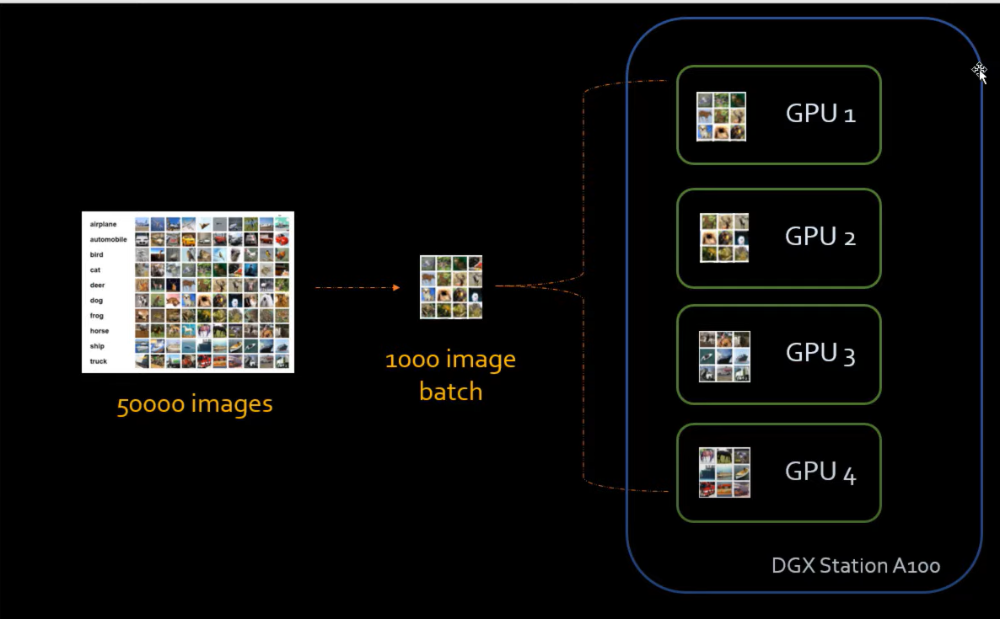
Here, the work is distributed among 4 GPU's. Each GPU is allocated with 250 images.

Sample code of Distributed Training - 
https://github.com/codebasics/deep-learning-keras-tf-tutorial/blob/master/43_distributed_training/dgx_benchamrking_tf_mirrored_stratergy.ipynb